# Introduction to COVID19

Coronavirus disease 2019 (COVID-19) is a contagious disease caused by severe acute respiratory syndrome coronavirus 2 (SARS-CoV-2). It was first identified in December 2019 in Wuhan, Hubei, China, and has resulted in an ongoing pandemic.
The disease has since spread worldwide, leading to an ongoing pandemic.
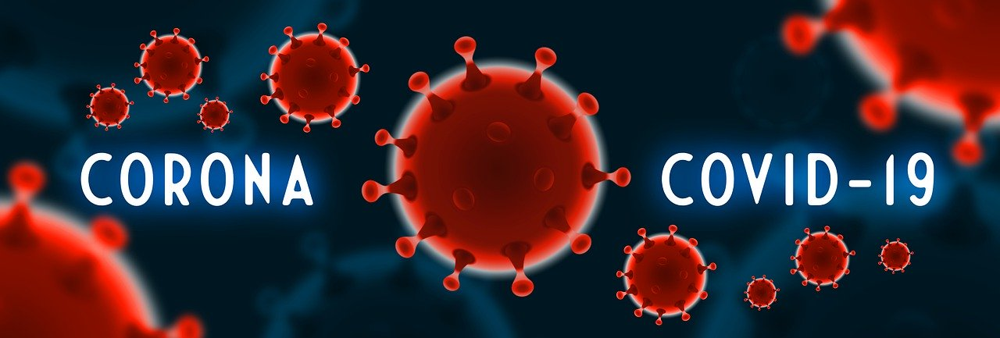

###  How COVID19 Spreads
![GIF](https://www.lavision.de/cms_images/news/bos-covid19.gif?m=1585647199)

#### Image credits: Lavision.de
The virus is spread primarily via small droplets from coughing, sneezing, and talking. The droplets are usually not airborne; however, those standing in close proximity may inhale them and become infected. People may also become infected by touching a contaminated surface and then touching their face. The transmission may also occur through aerosols that can stay suspended in the air for longer periods of time in enclosed spaces. It is most contagious during the first three days after the onset of symptoms, although spread is possible before symptoms appear, and from people who are asymptomatic.

### COVID19 Diagnosis
![GIF](https://upload.wikimedia.org/wikipedia/commons/a/a6/Covid-19-Time-Course-05.gif)
####    Image credits: Wikipedia.org 
The standard method of diagnosis is by real-time reverse transcription polymerase chain reaction (rRT-PCR) from a nasopharyngeal swab. Chest CT imaging may also be helpful for diagnosis in individuals where there is a high suspicion of infection based on symptoms and risk factors, however guidelines do not recommend using it for routine.screening.

# How can we stop COVID19
![GIF](https://upload.wikimedia.org/wikipedia/commons/c/c5/Covid-19-curves-graphic-social-v3.gif)
####   Image credit: Wikimedia.org 

### To prevent the spread of COVID-19:
- <h>   1. Clean your hands often. Use soap and water, or an alcohol-based hand rub.
- <h>    2. Maintain a safe distance from anyone who is coughing or sneezing.
- <h>    3. Wear a mask when physical distancing is not possible.
- <h>    4. Don’t touch your eyes, nose or mouth.
- <h>     5. Cover your nose and mouth with your bent elbow or a tissue when you cough or sneeze.
- <h>    6. Stay home if you feel unwell.
- <h>    7. If you have a fever, cough and difficulty breathing, seek medical attention.

## Import all necessary Libraries

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
import plotly.figure_factory as ff
from plotly.subplots import make_subplots
import folium
import plotly as py
py.offline.init_notebook_mode(connected=True)


%matplotlib inline

import math
import random
import datetime
from datetime import timedelta

import warnings
warnings.filterwarnings('ignore')

# Color pallete
cnf= '#39e46'
dth = '#ff2e63'
rec= '#21bf73'
act = '#fe9801'

## Load Datasets

In [2]:
df_Confirm = pd.read_csv('covid19_confirmed_global.csv')
df_Death = pd.read_csv('covid19_deaths_global.csv')
df_Recover = pd.read_csv('covid19_recovered_global.csv')

In [3]:
df_Confirm.shape, df_Death.shape, df_Recover.shape

((266, 248), (266, 248), (253, 248))

# Data Pre-Processing

### Sort data with Province/State

In [4]:
df_Confirm = df_Confirm.sort_values(by=['Province/State'])
df_Confirm = df_Confirm.reset_index(drop=True)

df_Death = df_Death.sort_values(by=['Province/State'])
df_Death = df_Death.reset_index(drop=True)

df_Recover = df_Recover.sort_values(by=['Province/State'])
df_Recover = df_Recover.reset_index(drop=True)

In [5]:
df_Confirm[["Province/State","Country/Region"]].equals(df_Death[["Province/State","Country/Region"]])

True

In [6]:
df_Confirm[["Province/State","Country/Region"]].equals(df_Recover[["Province/State","Country/Region"]])

False

In [7]:
df_Confirm_1= df_Confirm[['Province/State','Country/Region']]
df_Recover_2= df_Recover[["Province/State","Country/Region"]]
df_diff = pd.concat([df_Confirm_1,df_Recover_2]).drop_duplicates(keep=False)
df_diff

,Province/State,Country/Region
0,Alberta,Canada
8,British Columbia,Canada
14,Diamond Princess,Canada
22,Grand Princess,Canada
42,Manitoba,Canada
46,New Brunswick,Canada
49,Newfoundland and Labrador,Canada
52,Northwest Territories,Canada
53,Nova Scotia,Canada
54,Ontario,Canada


In [8]:
df_Confirm[(df_Confirm['Country/Region']== 'Canada')]

,Province/State,Country/Region,Lat,Long,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,...,9/12/20,9/13/20,9/14/20,9/15/20,9/16/20,9/17/20,9/18/20,9/19/20,9/20/20,9/21/20
0,Alberta,Canada,53.9333,-116.5765,0,0,0,0,0,0,...,15415,15415,15833,15957,16128,16274,16381,16381,16381,16739
8,British Columbia,Canada,53.7267,-127.6476,0,0,0,0,0,0,...,6962,6962,7279,7376,7498,7663,7842,7842,7842,8208
14,Diamond Princess,Canada,0.0000,0.0000,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
22,Grand Princess,Canada,0.0000,0.0000,0,0,0,0,0,0,...,13,13,13,13,13,13,13,13,13,13
42,Manitoba,Canada,53.7609,-98.8139,0,0,0,0,0,0,...,1410,1428,1449,1466,1489,1500,1540,1558,1586,1608
46,New Brunswick,Canada,46.5653,-66.4619,0,0,0,0,0,0,...,193,193,194,194,194,194,194,194,194,196
49,Newfoundland and Labrador,Canada,53.1355,-57.6604,0,0,0,0,0,0,...,271,271,271,271,271,271,272,272,272,272
52,Northwest Territories,Canada,64.8255,-124.8457,0,0,0,0,0,0,...,5,5,5,5,5,5,5,5,5,5
53,Nova Scotia,Canada,44.6820,-63.7443,0,0,0,0,0,0,...,1086,1086,1086,1086,1086,1086,1086,1086,1086,1086
54,Ontario,Canada,51.2538,-85.3232,0,0,0,0,1,1,...,46323,46485,46905,47165,47488,47688,48219,48317,48950,49442


In [9]:
Confirm_dates = df_Confirm.columns[4:]
Death_dates = df_Death.columns[4:]
print(Confirm_dates)
print(Death_dates)

Index(['1/22/20', '1/23/20', '1/24/20', '1/25/20', '1/26/20', '1/27/20',
       '1/28/20', '1/29/20', '1/30/20', '1/31/20',
       ...
       '9/12/20', '9/13/20', '9/14/20', '9/15/20', '9/16/20', '9/17/20',
       '9/18/20', '9/19/20', '9/20/20', '9/21/20'],
      dtype='object', length=244)
Index(['1/22/20', '1/23/20', '1/24/20', '1/25/20', '1/26/20', '1/27/20',
       '1/28/20', '1/29/20', '1/30/20', '1/31/20',
       ...
       '9/12/20', '9/13/20', '9/14/20', '9/15/20', '9/16/20', '9/17/20',
       '9/18/20', '9/19/20', '9/20/20', '9/21/20'],
      dtype='object', length=244)


In [10]:
Confirm_dates.equals(Death_dates)

True

### Process datasets, Confirmed and Deaths case

In [11]:
df_Confirm_melted = df_Confirm.melt(id_vars=['Province/State', 'Country/Region', 'Lat', 'Long'], 
                              value_vars=Confirm_dates, 
                              var_name='Date',
                              value_name='Confirmed')
df_Confirm_melted

,Province/State,Country/Region,Lat,Long,Date,Confirmed
0,Alberta,Canada,53.933300,-116.576500,1/22/20,0
1,Anguilla,United Kingdom,18.220600,-63.068600,1/22/20,0
2,Anhui,China,31.825700,117.226400,1/22/20,1
3,Aruba,Netherlands,12.521100,-69.968300,1/22/20,0
4,Australian Capital Territory,Australia,-35.473500,149.012400,1/22/20,0
...,...,...,...,...,...,...
64899,NaN,West Bank and Gaza,31.952200,35.233200,9/21/20,36151
64900,NaN,Western Sahara,24.215500,-12.885800,9/21/20,10
64901,NaN,Yemen,15.552727,48.516388,9/21/20,2028
64902,NaN,Zambia,-13.133897,27.849332,9/21/20,14175


In [12]:
df_Death_melted = df_Death.melt(id_vars=['Province/State', 'Country/Region', 'Lat', 'Long'], 
                              value_vars=Death_dates, 
                              var_name='Date',
                              value_name='Deaths')
df_Death_melted

,Province/State,Country/Region,Lat,Long,Date,Deaths
0,Alberta,Canada,53.933300,-116.576500,1/22/20,0
1,Anguilla,United Kingdom,18.220600,-63.068600,1/22/20,0
2,Anhui,China,31.825700,117.226400,1/22/20,0
3,Aruba,Netherlands,12.521100,-69.968300,1/22/20,0
4,Australian Capital Territory,Australia,-35.473500,149.012400,1/22/20,0
...,...,...,...,...,...,...
64899,NaN,West Bank and Gaza,31.952200,35.233200,9/21/20,265
64900,NaN,Western Sahara,24.215500,-12.885800,9/21/20,1
64901,NaN,Yemen,15.552727,48.516388,9/21/20,586
64902,NaN,Zambia,-13.133897,27.849332,9/21/20,331


## Combined Confirm and Death melted data sets

In [13]:
df_combined = pd.concat([df_Confirm_melted, df_Death_melted["Deaths"]], axis = 1, sort = False)
df_combined

,Province/State,Country/Region,Lat,Long,Date,Confirmed,Deaths
0,Alberta,Canada,53.933300,-116.576500,1/22/20,0,0
1,Anguilla,United Kingdom,18.220600,-63.068600,1/22/20,0,0
2,Anhui,China,31.825700,117.226400,1/22/20,1,0
3,Aruba,Netherlands,12.521100,-69.968300,1/22/20,0,0
4,Australian Capital Territory,Australia,-35.473500,149.012400,1/22/20,0,0
...,...,...,...,...,...,...,...
64899,NaN,West Bank and Gaza,31.952200,35.233200,9/21/20,36151,265
64900,NaN,Western Sahara,24.215500,-12.885800,9/21/20,10,1
64901,NaN,Yemen,15.552727,48.516388,9/21/20,2028,586
64902,NaN,Zambia,-13.133897,27.849332,9/21/20,14175,331


In [14]:
df_combined.fillna(0, inplace=True)

In [15]:
#  Formating data features 
import datetime
def format_time(datetime_str):    
    d = datetime.datetime.strptime(datetime_str, '%m/%d/%y')    
    return d.date()

df_combined["Date"] = df_combined["Date"].apply(format_time)
df_combined

,Province/State,Country/Region,Lat,Long,Date,Confirmed,Deaths
0,Alberta,Canada,53.933300,-116.576500,2020-01-22,0,0
1,Anguilla,United Kingdom,18.220600,-63.068600,2020-01-22,0,0
2,Anhui,China,31.825700,117.226400,2020-01-22,1,0
3,Aruba,Netherlands,12.521100,-69.968300,2020-01-22,0,0
4,Australian Capital Territory,Australia,-35.473500,149.012400,2020-01-22,0,0
...,...,...,...,...,...,...,...
64899,0,West Bank and Gaza,31.952200,35.233200,2020-09-21,36151,265
64900,0,Western Sahara,24.215500,-12.885800,2020-09-21,10,1
64901,0,Yemen,15.552727,48.516388,2020-09-21,2028,586
64902,0,Zambia,-13.133897,27.849332,2020-09-21,14175,331


In [16]:
grouped_by_date = df_combined.groupby("Date")

In [17]:
for date, group in grouped_by_date:
    print("==========")
    print(date)
    print("==========")
    print(group[["Province/State","Country/Region", "Confirmed", "Deaths"]])

2020-01-22
                   Province/State      Country/Region  Confirmed  Deaths
0                         Alberta              Canada          0       0
1                        Anguilla      United Kingdom          0       0
2                           Anhui               China          1       0
3                           Aruba         Netherlands          0       0
4    Australian Capital Territory           Australia          0       0
..                            ...                 ...        ...     ...
261                             0  West Bank and Gaza          0       0
262                             0      Western Sahara          0       0
263                             0               Yemen          0       0
264                             0              Zambia          0       0
265                             0            Zimbabwe          0       0

[266 rows x 4 columns]
2020-01-23
                   Province/State      Country/Region  Confirmed  Deaths
266  

[266 rows x 4 columns]
2020-02-06
                    Province/State      Country/Region  Confirmed  Deaths
3990                       Alberta              Canada          0       0
3991                      Anguilla      United Kingdom          0       0
3992                         Anhui               China        591       0
3993                         Aruba         Netherlands          0       0
3994  Australian Capital Territory           Australia          0       0
...                            ...                 ...        ...     ...
4251                             0  West Bank and Gaza          0       0
4252                             0      Western Sahara          0       0
4253                             0               Yemen          0       0
4254                             0              Zambia          0       0
4255                             0            Zimbabwe          0       0

[266 rows x 4 columns]
2020-02-07
                    Province/State      Cou

[266 rows x 4 columns]
2020-02-19
                    Province/State      Country/Region  Confirmed  Deaths
7448                       Alberta              Canada          0       0
7449                      Anguilla      United Kingdom          0       0
7450                         Anhui               China        986       6
7451                         Aruba         Netherlands          0       0
7452  Australian Capital Territory           Australia          0       0
...                            ...                 ...        ...     ...
7709                             0  West Bank and Gaza          0       0
7710                             0      Western Sahara          0       0
7711                             0               Yemen          0       0
7712                             0              Zambia          0       0
7713                             0            Zimbabwe          0       0

[266 rows x 4 columns]
2020-02-20
                    Province/State      Cou

[266 rows x 4 columns]
2020-03-07
                     Province/State      Country/Region  Confirmed  Deaths
11970                       Alberta              Canada          2       0
11971                      Anguilla      United Kingdom          0       0
11972                         Anhui               China        990       6
11973                         Aruba         Netherlands          0       0
11974  Australian Capital Territory           Australia          0       0
...                             ...                 ...        ...     ...
12231                             0  West Bank and Gaza         16       0
12232                             0      Western Sahara          0       0
12233                             0               Yemen          0       0
12234                             0              Zambia          0       0
12235                             0            Zimbabwe          0       0

[266 rows x 4 columns]
2020-03-08
                     Province/S

                     Province/State      Country/Region  Confirmed  Deaths
16758                       Alberta              Canada        358       2
16759                      Anguilla      United Kingdom          0       0
16760                         Anhui               China        990       6
16761                         Aruba         Netherlands         17       0
16762  Australian Capital Territory           Australia         39       0
...                             ...                 ...        ...     ...
17019                             0  West Bank and Gaza         59       0
17020                             0      Western Sahara          0       0
17021                             0               Yemen          0       0
17022                             0              Zambia         12       0
17023                             0            Zimbabwe          3       1

[266 rows x 4 columns]
2020-03-26
                     Province/State      Country/Region  Confirme

                     Province/State      Country/Region  Confirmed  Deaths
22078                       Alberta              Canada       1870      48
22079                      Anguilla      United Kingdom          3       0
22080                         Anhui               China        991       6
22081                         Aruba         Netherlands         92       0
22082  Australian Capital Territory           Australia        103       2
...                             ...                 ...        ...     ...
22339                             0  West Bank and Gaza        284       2
22340                             0      Western Sahara          6       0
22341                             0               Yemen          1       0
22342                             0              Zambia         45       2
22343                             0            Zimbabwe         17       3

[266 rows x 4 columns]
2020-04-15
                     Province/State      Country/Region  Confirme

[266 rows x 4 columns]
2020-05-02
                     Province/State      Country/Region  Confirmed  Deaths
26866                       Alberta              Canada       5670      94
26867                      Anguilla      United Kingdom          3       0
26868                         Anhui               China        991       6
26869                         Aruba         Netherlands        100       2
26870  Australian Capital Territory           Australia        106       3
...                             ...                 ...        ...     ...
27127                             0  West Bank and Gaza        353       2
27128                             0      Western Sahara          6       0
27129                             0               Yemen         10       2
27130                             0              Zambia        119       3
27131                             0            Zimbabwe         34       4

[266 rows x 4 columns]
2020-05-03
                     Province/S

                     Province/State      Country/Region  Confirmed  Deaths
30856                       Alberta              Canada       6644     127
30857                      Anguilla      United Kingdom          3       0
30858                         Anhui               China        991       6
30859                         Aruba         Netherlands        101       3
30860  Australian Capital Territory           Australia        107       3
...                             ...                 ...        ...     ...
31117                             0  West Bank and Gaza        381       2
31118                             0      Western Sahara          6       0
31119                             0               Yemen        128      20
31120                             0              Zambia        753       7
31121                             0            Zimbabwe         44       4

[266 rows x 4 columns]
2020-05-18
                     Province/State      Country/Region  Confirme

[266 rows x 4 columns]
2020-06-01
                     Province/State      Country/Region  Confirmed  Deaths
34846                       Alberta              Canada       7044     143
34847                      Anguilla      United Kingdom          3       0
34848                         Anhui               China        991       6
34849                         Aruba         Netherlands        101       3
34850  Australian Capital Territory           Australia        107       3
...                             ...                 ...        ...     ...
35107                             0  West Bank and Gaza        449       3
35108                             0      Western Sahara          9       1
35109                             0               Yemen        354      84
35110                             0              Zambia       1089       7
35111                             0            Zimbabwe        203       4

[266 rows x 4 columns]
2020-06-02
                     Province/S

[266 rows x 4 columns]
2020-06-20
                     Province/State      Country/Region  Confirmed  Deaths
39900                       Alberta              Canada       7673     152
39901                      Anguilla      United Kingdom          3       0
39902                         Anhui               China        991       6
39903                         Aruba         Netherlands        101       3
39904  Australian Capital Territory           Australia        108       3
...                             ...                 ...        ...     ...
40161                             0  West Bank and Gaza        784       3
40162                             0      Western Sahara          9       1
40163                             0               Yemen        922     254
40164                             0              Zambia       1430      11
40165                             0            Zimbabwe        479       4

[266 rows x 4 columns]
2020-06-21
                     Province/S

[266 rows x 4 columns]
2020-07-09
                     Province/State      Country/Region  Confirmed  Deaths
44954                       Alberta              Canada       8519     161
44955                      Anguilla      United Kingdom          3       0
44956                         Anhui               China        991       6
44957                         Aruba         Netherlands        105       3
44958  Australian Capital Territory           Australia        113       3
...                             ...                 ...        ...     ...
45215                             0  West Bank and Gaza       5220      24
45216                             0      Western Sahara         10       1
45217                             0               Yemen       1356     361
45218                             0              Zambia       1895      42
45219                             0            Zimbabwe        885       9

[266 rows x 4 columns]
2020-07-10
                     Province/S

[266 rows x 4 columns]
2020-07-23
                     Province/State      Country/Region  Confirmed  Deaths
48678                       Alberta              Canada       9975     176
48679                      Anguilla      United Kingdom          3       0
48680                         Anhui               China        991       6
48681                         Aruba         Netherlands        117       3
48682  Australian Capital Territory           Australia        113       3
...                             ...                 ...        ...     ...
48939                             0  West Bank and Gaza       9744      67
48940                             0      Western Sahara         10       1
48941                             0               Yemen       1654     461
48942                             0              Zambia       3789     134
48943                             0            Zimbabwe       2124      28

[266 rows x 4 columns]
2020-07-24
                     Province/S

[266 rows x 4 columns]
2020-08-01
                     Province/State      Country/Region  Confirmed  Deaths
51072                       Alberta              Canada      10843     196
51073                      Anguilla      United Kingdom          3       0
51074                         Anhui               China        991       6
51075                         Aruba         Netherlands        121       3
51076  Australian Capital Territory           Australia        113       3
...                             ...                 ...        ...     ...
51333                             0  West Bank and Gaza      12160      83
51334                             0      Western Sahara         10       1
51335                             0               Yemen       1730     494
51336                             0              Zambia       6228     165
51337                             0            Zimbabwe       3659      69

[266 rows x 4 columns]
2020-08-02
                     Province/S

                     Province/State      Country/Region  Confirmed  Deaths
55328                       Alberta              Canada      12053     221
55329                      Anguilla      United Kingdom          3       0
55330                         Anhui               China        991       6
55331                         Aruba         Netherlands       1121       4
55332  Australian Capital Territory           Australia        113       3
...                             ...                 ...        ...     ...
55589                             0  West Bank and Gaza      16844     113
55590                             0      Western Sahara         10       1
55591                             0               Yemen       1882     535
55592                             0              Zambia       9839     264
55593                             0            Zimbabwe       5308     135

[266 rows x 4 columns]
2020-08-18
                     Province/State      Country/Region  Confirme

2020-08-27
                     Province/State      Country/Region  Confirmed  Deaths
57988                       Alberta              Canada      13318     237
57989                      Anguilla      United Kingdom          3       0
57990                         Anhui               China        991       6
57991                         Aruba         Netherlands       1848       8
57992  Australian Capital Territory           Australia        113       3
...                             ...                 ...        ...     ...
58249                             0  West Bank and Gaza      20677     141
58250                             0      Western Sahara         10       1
58251                             0               Yemen       1933     562
58252                             0              Zambia      11601     282
58253                             0            Zimbabwe       6292     189

[266 rows x 4 columns]
2020-08-28
                     Province/State      Country/Regio

[266 rows x 4 columns]
2020-09-11
                     Province/State      Country/Region  Confirmed  Deaths
61978                       Alberta              Canada      15415     253
61979                      Anguilla      United Kingdom          3       0
61980                         Anhui               China        991       6
61981                         Aruba         Netherlands       2898      18
61982  Australian Capital Territory           Australia        113       3
...                             ...                 ...        ...     ...
62239                             0  West Bank and Gaza      29256     204
62240                             0      Western Sahara         10       1
62241                             0               Yemen       2007     582
62242                             0              Zambia      13323     306
62243                             0            Zimbabwe       7479     224

[266 rows x 4 columns]
2020-09-12
                     Province/S

### Day wise data

In [18]:
df_day_wise = df_combined.groupby(["Date","Country/Region"]).aggregate({'Confirmed': 'sum', 'Deaths': 'sum',})
df_day_wise

Confirmed  Deaths
Date       Country/Region                       
2020-01-22 Afghanistan                 0       0
           Albania                     0       0
           Algeria                     0       0
           Andorra                     0       0
           Angola                      0       0
...                                  ...     ...
2020-09-21 West Bank and Gaza      36151     265
           Western Sahara             10       1
           Yemen                    2028     586
           Zambia                  14175     331
           Zimbabwe                 7683     225

[45872 rows x 2 columns]

In [19]:
df_day_wise.loc[format_time('5/22/20')]

,Confirmed,Deaths
Country/Region,,
Afghanistan,9216,205
Albania,981,31
Algeria,7918,582
Andorra,762,51
Angola,60,3
...,...,...
West Bank and Gaza,423,2
Western Sahara,6,0
Yemen,209,33


In [20]:
df_day_wise.loc[(format_time('09/21/20'),'US')]

Confirmed    6856884
Deaths        199865
Name: (2020-09-21, US), dtype: int64

## With Most Recent Date

In [21]:
most_recent_date = df_combined['Date'].max()
most_recent_date

datetime.date(2020, 9, 21)

In [22]:
df_most_recent= df_day_wise.loc[most_recent_date]
df_most_recent

,Confirmed,Deaths
Country/Region,,
Afghanistan,39074,1444
Albania,12535,364
Algeria,50023,1679
Andorra,1681,53
Angola,4117,154
...,...,...
West Bank and Gaza,36151,265
Western Sahara,10,1
Yemen,2028,586


In [23]:
df_most_recent.loc["France"]

Confirmed    496851
Deaths        31346
Name: France, dtype: int64

In [24]:
df_most_recent[df_most_recent.index == input("Enter country name : ")]

Enter country name : China


,Confirmed,Deaths
Country/Region,,
China,90381,4737


In [25]:
df_most_confirmed_recent_sorted = df_most_recent.sort_values(by="Confirmed", ascending=False)
df_most_confirmed_recent_sorted.head(10)

,Confirmed,Deaths
Country/Region,,
US,6856884,199865
India,5487580,87882
Brazil,4558040,137272
Russia,1105048,19420
Colombia,770435,24397
Peru,768895,31369
Mexico,700580,73697
Spain,671468,30663
South Africa,661936,15992


In [26]:
df_most_deaths_recent_sorted = df_most_recent.sort_values(by="Deaths", ascending=False)
df_most_deaths_recent_sorted.head(10)

,Confirmed,Deaths
Country/Region,,
US,6856884,199865
Brazil,4558040,137272
India,5487580,87882
Mexico,700580,73697
United Kingdom,401122,41877
Italy,299506,35724
Peru,768895,31369
France,496851,31346
Spain,671468,30663


### Processed data With Most Recent Date

In [27]:
most_recent_date = df_combined['Date'].max()
df_latest_day = df_combined[df_combined.Date==most_recent_date]

In [28]:
df_latest_day.head(2)

,Province/State,Country/Region,Lat,Long,Date,Confirmed,Deaths
64638,Alberta,Canada,53.9333,-116.5765,2020-09-21,16739,256
64639,Anguilla,United Kingdom,18.2206,-63.0686,2020-09-21,3,0


# Visualization

- <h>  Plotting on World Map by Folium Map

In [29]:
temp=df_latest_day[df_latest_day['Date']==max(df_latest_day['Date'])]
folium_map = folium.Map(location=[0,0], tiles='cartodbpositron',min_zoom=1, max_zoom=4, zoom_start=1)

for i in range(0, len(temp)):
    folium.Circle(location=[temp.iloc[i]['Lat'],temp.iloc[i]['Long']],color="crimson",fill='crimson',
                                           tooltip='<li><bold> Country: '+str(temp.iloc[i]['Country/Region'])+
                                           '<li><bold> Province/State: '+str(temp.iloc[i]['Province/State'])+
                                          '<li><bold> confirmed: '+str(temp.iloc[i]['Confirmed']) +
                                          '<li><bold> deaths: '+str(temp.iloc[i]['Deaths']),
                  radius=int(temp.iloc[i]['Confirmed'])**0.5).add_to(folium_map)
    
display(folium_map)

In [30]:
df_combined['Date']=pd.to_datetime(df_combined['Date'])

## Plotting Covid-19 data on world map with animation according to date by Choropleth

In [31]:
fig=px.choropleth(df_combined, locations='Country/Region', locationmode='country names', color=np.log(df_combined['Confirmed']),
                 hover_name='Country/Region', animation_frame=df_combined['Date'].dt.strftime("%y-%m-%d"),
                 title='Cases Over Time', color_continuous_scale=px.colors.sequential.Inferno)
fig.update(layout_coloraxis_showscale=True)
fig.show()

## Plotting Top 20 Country data, Deaths vs Confirmed Case (Cases are on log scale).

In [32]:
top=20
fig=px.scatter(
    df_latest_day.sort_values('Deaths', ascending=False).head(top),
              x='Confirmed', y='Deaths', color='Country/Region', size='Confirmed', height=700, text='Country/Region',
              log_x=True, log_y=True, title="Deaths vs Confirmed Case (Cases are on log scale)",
              )
fig.update_traces(textposition='top center')
fig.update_layout(showlegend=True)
fig.update_layout(xaxis_rangeslider_visible=True)
fig.show()

# Data Processing with Recovered datasets

In [33]:
df_Recover_melted = df_Recover.melt(id_vars=['Province/State', 'Country/Region', 'Lat', 'Long'], 
                              value_vars=Confirm_dates, 
                              var_name='Date',
                              value_name='Recovered')
df_Recover_melted

,Province/State,Country/Region,Lat,Long,Date,Recovered
0,Anguilla,United Kingdom,18.220600,-63.068600,1/22/20,0
1,Anhui,China,31.825700,117.226400,1/22/20,0
2,Aruba,Netherlands,12.521100,-69.968300,1/22/20,0
3,Australian Capital Territory,Australia,-35.473500,149.012400,1/22/20,0
4,Beijing,China,40.182400,116.414200,1/22/20,0
...,...,...,...,...,...,...
61727,NaN,West Bank and Gaza,31.952200,35.233200,9/21/20,24428
61728,NaN,Western Sahara,24.215500,-12.885800,9/21/20,8
61729,NaN,Yemen,15.552727,48.516388,9/21/20,1235
61730,NaN,Zambia,-13.133897,27.849332,9/21/20,13629


In [34]:
df_Recover_melted["Date"] = df_Recover_melted["Date"].apply(format_time)
df_Recover_melted

,Province/State,Country/Region,Lat,Long,Date,Recovered
0,Anguilla,United Kingdom,18.220600,-63.068600,2020-01-22,0
1,Anhui,China,31.825700,117.226400,2020-01-22,0
2,Aruba,Netherlands,12.521100,-69.968300,2020-01-22,0
3,Australian Capital Territory,Australia,-35.473500,149.012400,2020-01-22,0
4,Beijing,China,40.182400,116.414200,2020-01-22,0
...,...,...,...,...,...,...
61727,NaN,West Bank and Gaza,31.952200,35.233200,2020-09-21,24428
61728,NaN,Western Sahara,24.215500,-12.885800,2020-09-21,8
61729,NaN,Yemen,15.552727,48.516388,2020-09-21,1235
61730,NaN,Zambia,-13.133897,27.849332,2020-09-21,13629


In [35]:
df_Recover_melted.fillna(0, inplace=True)
df_Recover_melted 

,Province/State,Country/Region,Lat,Long,Date,Recovered
0,Anguilla,United Kingdom,18.220600,-63.068600,2020-01-22,0
1,Anhui,China,31.825700,117.226400,2020-01-22,0
2,Aruba,Netherlands,12.521100,-69.968300,2020-01-22,0
3,Australian Capital Territory,Australia,-35.473500,149.012400,2020-01-22,0
4,Beijing,China,40.182400,116.414200,2020-01-22,0
...,...,...,...,...,...,...
61727,0,West Bank and Gaza,31.952200,35.233200,2020-09-21,24428
61728,0,Western Sahara,24.215500,-12.885800,2020-09-21,8
61729,0,Yemen,15.552727,48.516388,2020-09-21,1235
61730,0,Zambia,-13.133897,27.849332,2020-09-21,13629


## Processed Recovered Data with Day Wise

In [36]:
df_recovered_day_wise= df_Recover_melted.groupby(["Date","Country/Region"]).aggregate({'Recovered': 'sum'})
df_recovered_day_wise

Recovered
Date       Country/Region               
2020-01-22 Afghanistan                 0
           Albania                     0
           Algeria                     0
           Andorra                     0
           Angola                      0
...                                  ...
2020-09-21 West Bank and Gaza      24428
           Western Sahara              8
           Yemen                    1235
           Zambia                  13629
           Zimbabwe                 5924

[45872 rows x 1 columns]

In [37]:
df_recovered_day_wise.loc[(format_time('09/21/20'),'US')]

Recovered    2615949
Name: (2020-09-21, US), dtype: int64

# Combined All three Data sets: Confirmed, Deaths and Recovered data

In [38]:
df_combined_final= pd.concat([df_day_wise, df_recovered_day_wise["Recovered"]], axis = 1, sort = False)

### Create New features (active, Death Percentage and recovery Percentage)  

In [39]:
df_combined_final["active"] = df_combined_final["Confirmed"] -(df_combined_final["Deaths"]+df_combined_final["Recovered"])

In [40]:
df_combined_final["Death Percentage"] = (df_combined_final["Deaths"]/df_combined_final["Confirmed"]) *100
df_combined_final["Recovery Percentage"] = (df_combined_final["Recovered"]/df_combined_final["Confirmed"]) *100

In [41]:
df_combined_final

Confirmed  Deaths  Recovered  active  \
Date       Country/Region                                             
2020-01-22 Afghanistan                 0       0          0       0   
           Albania                     0       0          0       0   
           Algeria                     0       0          0       0   
           Andorra                     0       0          0       0   
           Angola                      0       0          0       0   
...                                  ...     ...        ...     ...   
2020-09-21 West Bank and Gaza      36151     265      24428   11458   
           Western Sahara             10       1          8       1   
           Yemen                    2028     586       1235     207   
           Zambia                  14175     331      13629     215   
           Zimbabwe                 7683     225       5924    1534   

                               Death Percentage  Recovery Percentage  
Date       Country/Region                                             
2020-01-22 Afghanistan                      NaN                  NaN  
           Albania                          NaN                  NaN  
           Algeria                          NaN                  NaN  
           Andorra                          NaN                  NaN  
           Angola                           NaN                  NaN  
...                                         ...                  ...  
2020-09-21 West Bank and Gaza          0.733036            67.572128  
           Western Sahara             10.000000            80.000000  
           Yemen                      28.895464            60.897436  
           Zambia                      2.335097            96.148148  
           Zimbabwe                    2.928544            77.105297  

[45872 rows x 6 columns]

In [42]:
df_combined_final.fillna(0, inplace=True)
df_combined_final

Confirmed  Deaths  Recovered  active  \
Date       Country/Region                                             
2020-01-22 Afghanistan                 0       0          0       0   
           Albania                     0       0          0       0   
           Algeria                     0       0          0       0   
           Andorra                     0       0          0       0   
           Angola                      0       0          0       0   
...                                  ...     ...        ...     ...   
2020-09-21 West Bank and Gaza      36151     265      24428   11458   
           Western Sahara             10       1          8       1   
           Yemen                    2028     586       1235     207   
           Zambia                  14175     331      13629     215   
           Zimbabwe                 7683     225       5924    1534   

                               Death Percentage  Recovery Percentage  
Date       Country/Region                                             
2020-01-22 Afghanistan                 0.000000             0.000000  
           Albania                     0.000000             0.000000  
           Algeria                     0.000000             0.000000  
           Andorra                     0.000000             0.000000  
           Angola                      0.000000             0.000000  
...                                         ...                  ...  
2020-09-21 West Bank and Gaza          0.733036            67.572128  
           Western Sahara             10.000000            80.000000  
           Yemen                      28.895464            60.897436  
           Zambia                      2.335097            96.148148  
           Zimbabwe                    2.928544            77.105297  

[45872 rows x 6 columns]

In [43]:
df_most_recent= df_combined_final.loc[most_recent_date]
df_most_recent

,Confirmed,Deaths,Recovered,active,Death Percentage,Recovery Percentage
Country/Region,,,,,,
Afghanistan,39074,1444,32576,5054,3.695552,83.370016
Albania,12535,364,6995,5176,2.903869,55.803750
Algeria,50023,1679,35180,13164,3.356456,70.327649
Andorra,1681,53,1199,429,3.152885,71.326591
Angola,4117,154,1449,2514,3.740588,35.195531
...,...,...,...,...,...,...
West Bank and Gaza,36151,265,24428,11458,0.733036,67.572128
Western Sahara,10,1,8,1,10.000000,80.000000
Yemen,2028,586,1235,207,28.895464,60.897436


In [44]:
df_most_recent= df_combined_final.loc[most_recent_date]
df_most_recent

,Confirmed,Deaths,Recovered,active,Death Percentage,Recovery Percentage
Country/Region,,,,,,
Afghanistan,39074,1444,32576,5054,3.695552,83.370016
Albania,12535,364,6995,5176,2.903869,55.803750
Algeria,50023,1679,35180,13164,3.356456,70.327649
Andorra,1681,53,1199,429,3.152885,71.326591
Angola,4117,154,1449,2514,3.740588,35.195531
...,...,...,...,...,...,...
West Bank and Gaza,36151,265,24428,11458,0.733036,67.572128
Western Sahara,10,1,8,1,10.000000,80.000000
Yemen,2028,586,1235,207,28.895464,60.897436


In [45]:
df_most_recovered_recent_sorted = df_most_recent.sort_values(by="Recovered", ascending=False)
df_most_recovered_recent_sorted

,Confirmed,Deaths,Recovered,active,Death Percentage,Recovery Percentage
Country/Region,,,,,,
India,5487580,87882,4396399,1003299,1.601471,80.115443
Brazil,4558040,137272,3993432,427336,3.011645,87.612921
US,6856884,199865,2615949,4041070,2.914808,38.150696
Russia,1105048,19420,909026,176602,1.757390,82.261223
Colombia,770435,24397,640900,105138,3.166653,83.186771
...,...,...,...,...,...,...
Holy See,12,0,12,0,0.000000,100.000000
Western Sahara,10,1,8,1,10.000000,80.000000
MS Zaandam,9,2,0,7,22.222222,0.000000


# Visualization

### Plotting Confirmed, Deaths and Recovered data

In [46]:
Confirmed=df_combined.groupby('Date').sum()['Confirmed'].reset_index()
Deaths=df_combined.groupby('Date').sum()['Deaths'].reset_index()
Recovered=df_Recover_melted.groupby('Date').sum()['Recovered'].reset_index()

In [47]:
fig=go.Figure()
fig.add_trace(go.Scatter(x=Confirmed['Date'], y=Confirmed['Confirmed'], mode="lines+markers", name='Confirmed', line=dict(color="Orange", width=4)))
fig.add_trace(go.Scatter(x=Deaths['Date'], y=Deaths['Deaths'], mode="lines+markers", name='Deaths', line=dict(color="Red", width=4)))
fig.add_trace(go.Scatter(x=Recovered['Date'], y=Recovered['Recovered'], mode="lines+markers", name='Recovered', line=dict(color="Green", width=4)))
fig.show()

## Case Over the Time with Area Plot

In [48]:
temp=df_combined_final.groupby("Date")["Confirmed", "Deaths","Recovered", "active"].sum().reset_index()
temp=temp[temp['Date']==max(temp['Date'])].reset_index(drop=True)
tm=temp.melt(id_vars='Date', value_vars=["Confirmed", "Deaths","Recovered"])
fig=px.treemap(tm, path=['variable'], values='value', height=300, width=1000, color_discrete_sequence=[act, rec, dth])
fig.data[0].textinfo='label+text+value'
fig.show()

In [49]:
temp=df_combined_final.groupby('Date')["Recovered","Deaths", "active"].sum().reset_index()
temp=temp.melt(id_vars='Date', value_vars=["Recovered","Deaths", "active"], var_name='Case', value_name='Count')
fig= px.area(temp, x='Date', y='Count', color='Case', height=600, title='Case Over Time',color_discrete_sequence=[rec, dth, act])
fig.update_layout(xaxis_rangeslider_visible=True)
fig.show()

## Plotting With total case Country wise with Date (Confirmed, Deaths and Recovered)

In [67]:
# plt.style.use('ggplot')


# for country, df_country in df_combined_final.groupby("Country/Region"):    
#     dates = list(df_country.index.get_level_values('Date'))
#     confirmed = list(df_country.Confirmed)
#     deaths = list(df_country.Deaths)
#     recovered= list(df_country.Recovered)
#     plt.figure(figsize=(14,7))
#     plt.bar(dates, confirmed, color='lightblue', label="Total number of confirmed cases")
#     plt.bar(dates, recovered, color='lightgreen',label="Total number of recovered cases")
#     plt.bar(dates, deaths, color='red',label="Total number of reported deaths")
#     plt.xlabel("Dates")
#     plt.ylabel("Number")
#     plt.title(country)
#     plt.legend()
#     plt.show()

In [68]:
# dates = list(df_country.index.get_level_values('Date'))
# plt.rcParams["figure.figsize"] = (12,7)
# for country, df_country in df_combined_final.groupby(level=1):    
#     # extract the daily number of confirmed cases and deaths (reverse cumulative sum)
#     df_unrolled = df_country.diff().fillna(df_country)
#     df_unrolled = df_unrolled.drop(['Death Percentage', 'Recovery Percentage'], axis=1)
    
#     plt.plot(dates, df_unrolled["Confirmed"], color='blue', label="Confirmed cases per day")
#     plt.plot(dates, df_unrolled["Recovered"], color='green', label="Recovered cases per day")
#     plt.plot(dates, df_unrolled["Deaths"], color='red', label="Deaths per day")
#     plt.xlabel("Dates")
#     plt.ylabel("Number")
#     plt.title(country)
#     plt.legend()
#     plt.show()

## Pie Plot of Top10 Countries (Confirmed, Deaths and Recovered)

In [52]:
def plot_pie(df, column, title):
    labels = list(df.index)
    sizes = list(df[column])
    explode = [0 for n in range(10)]
    
    with plt.style.context(
        { "axes.prop_cycle" : plt.cycler("color", plt.cm.tab20c.colors)}):
        fig1, ax1 = plt.subplots(figsize=(14,6))
        ax1.pie(sizes, 
                explode=explode, 
                labels=labels, 
                autopct='%1.2f%%', 
                shadow=False, 
                startangle=0)
        ax1.axis('equal')  # Un rapport d'aspect égal garantit que le diagramme sera dessiné en cercle.
        plt.legend()
        plt.title(title)
    
    centre_circle = plt.Circle((0,0),0.70,fc='white')
    fig = plt.gcf()
    fig.gca().add_artist(centre_circle)
    plt.show()

<Figure size 1440x720 with 0 Axes>

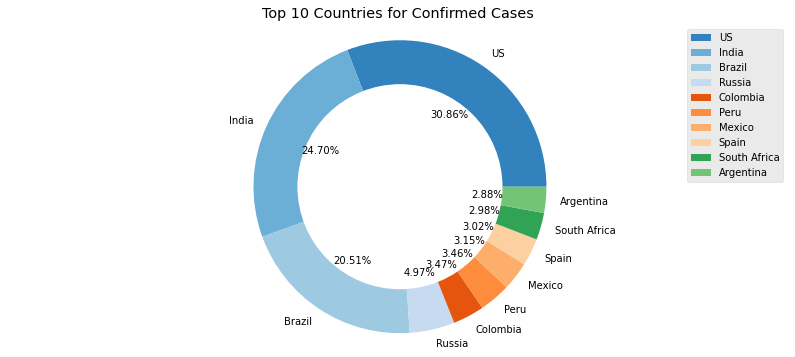

In [53]:
fig =plt.figure(figsize=(20,10))
top10_countries_confirmed = df_most_confirmed_recent_sorted.head(10)
plot_pie(top10_countries_confirmed, "Confirmed", "Top 10 Countries for Confirmed Cases")

<Figure size 1440x720 with 0 Axes>

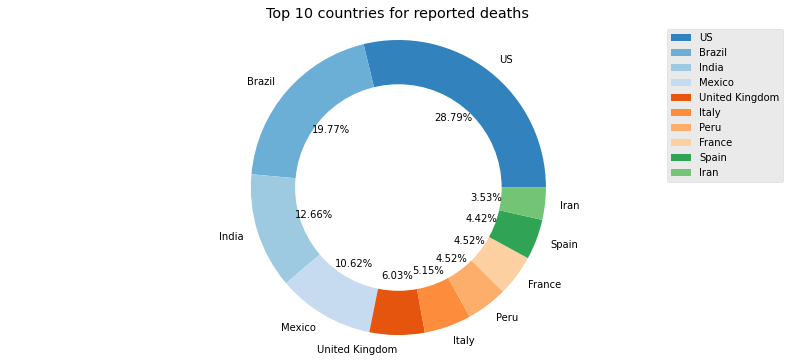

In [54]:
fig =plt.figure(figsize=(20,10))
plot_pie(df_most_deaths_recent_sorted.head(10), "Deaths", "Top 10 countries for reported deaths")

<Figure size 1440x720 with 0 Axes>

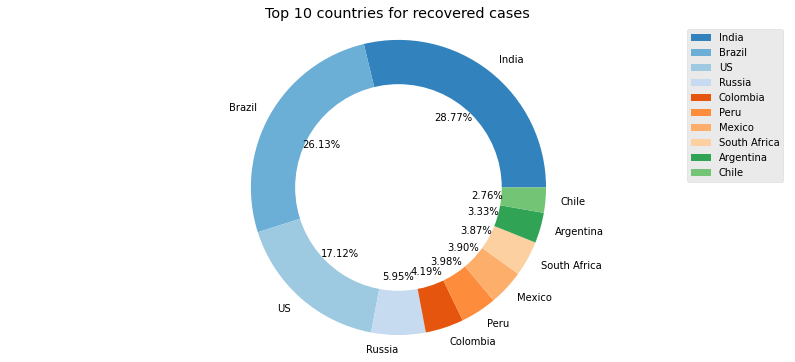

In [55]:
fig =plt.figure(figsize=(20,10))
plot_pie(df_most_recovered_recent_sorted.head(10), "Recovered", "Top 10 countries for recovered cases")

## Treemap of (Confirmed, Deaths and Recovered)

In [56]:
df_combined_final=df_combined_final.reset_index()

In [57]:
full_latest=df_combined_final[df_combined_final['Date']==max(df_combined_final['Date'])]
fig=px.treemap(full_latest.sort_values(by='Confirmed', ascending=False).reset_index(drop=True),
              path=['Country/Region'], values='Confirmed', height=700, title="No. Of Confirmed Cases",
              color_discrete_sequence=px.colors.qualitative.Dark2)
fig.data[0].textinfo='label+text+value'
fig.show()

In [58]:
fig=px.treemap(full_latest.sort_values(by='Deaths', ascending=False).reset_index(drop=True),
              path=['Country/Region'], values='Deaths', height=700, title="No. Of Deaths Cases Country wise",
              color_discrete_sequence=px.colors.qualitative.Dark2)
fig.data[0].textinfo='label+text+value'
fig.show()

In [59]:
fig=px.treemap(full_latest.sort_values(by='Recovered', ascending=False).reset_index(drop=True),
              path=['Country/Region'], values='Recovered', height=700, title="No. Of Recovered Cases Country wise",
              color_discrete_sequence=px.colors.qualitative.Dark2)
fig.data[0].textinfo='label+text+value'
fig.show()

## Contribution of Country in Confirmed, Deaths and Recovered Cases Rise

In [66]:
# fig= px.bar(df_combined_final, x='Date', y='Confirmed', color='Country/Region', height=700, title="Contribution of Country in Confirmed Cases Rise",
#           color_discrete_sequence=px.colors.cyclical.mygbm)
# fig.show()

In [65]:
# fig= px.bar(df_combined, x='Date', y='Deaths', color='Country/Region', height=700, title="Contribution of Country in Deaths Cases Rise",
#           color_discrete_sequence=px.colors.cyclical.mygbm)
# fig.show()

In [64]:
# fig= px.bar(df_combined_final, x='Date', y='Recovered', color='Country/Region', height=700, title="Contribution of Country in Recovered Cases Rise",
#           color_discrete_sequence=px.colors.cyclical.mygbm)
# fig.show()

## Total Confirmed, Total Deaths, Total Recovered and Total Active Case Visualization

In [63]:
fig = go.Figure()
fig.add_trace(go.Indicator(mode="number",value=int(df_most_recent["Confirmed"].sum()),number={"valueformat":"0.f"},
             title={"text":"Total Confirmed"},domain={"row":0,"column":0}))

fig.add_trace(go.Indicator(mode="number",value=int(df_most_recent["Deaths"].sum()),number={"valueformat":"0.f"},
             title={"text":"Total Deaths"},domain={"row":0,"column":1}))

fig.add_trace(go.Indicator(mode="number",value=int(df_most_recent["Recovered"].sum()),number={"valueformat":"0.f"},
             title={"text":"Total Recovered"},domain={"row":1,"column":0}))

fig.add_trace(go.Indicator(mode="number",value=int(df_most_recent["active"].sum()),number={"valueformat":"0.f"},
             title={"text":"Total Active Case"},domain={"row":1,"column":1}))

fig.update_layout(grid={"rows":2,"columns":2,"pattern":"independent"})
fig.show()

## Conclusion:
- <h>     As the Global cases for covid-19 increasing day by day, every citizen of a country have to take it seriously and break the chain of the mutation, Cases are increasing on rapid rate and its count is high as compared to the previous day
- <h>    The Daily Recovery rate is less, hospital facilities such oxygen, ventilators are seems to be in high demand to lead the recovery cases
- <h>    The daily deaths are increasing slowly but still have to control death cases making it negligible by availing    the medical facilities in more numbers.
- <h>    US having enormous cases followed by India and Brazil, Country must follow to get as much as population of their country to be vaccinated as soon as possible, Also countries which are having less number of cases must follow the safety measures to make their country covid free.